## Using a Decision Tree Regressor to Predict the IMDb Ratings of Movies

## Import the Data

In [1]:
import numpy as np
import pandas as pd

movies = pd.read_csv('IMDb_movies.csv', dtype={'country': str, 'genre': str})
print(movies.shape)
movies.head()

(85855, 22)


D:\Data\A\Documents\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,imdb_title_id,title,original_title,year,date_published,genre,duration,country,language,director,...,actors,description,avg_vote,votes,budget,usa_gross_income,worlwide_gross_income,metascore,reviews_from_users,reviews_from_critics
0,tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,...,"Blanche Bayliss, William Courtenay, Chauncey D...",The adventures of a female reporter in the 1890s.,5.9,154,NaN,NaN,NaN,NaN,1.0,2.0
1,tt0000574,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,None,Charles Tait,...,"Elizabeth Tait, John Tait, Norman Campbell, Be...",True story of notorious Australian outlaw Ned ...,6.1,589,$ 2250,NaN,NaN,NaN,7.0,7.0
2,tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,...,"Asta Nielsen, Valdemar Psilander, Gunnar Helse...",Two men of high rank are both wooing the beaut...,5.8,188,NaN,NaN,NaN,NaN,5.0,2.0
3,tt0002101,Cleopatra,Cleopatra,1912,1912-11-13,"Drama, History",100,USA,English,Charles L. Gaskill,...,"Helen Gardner, Pearl Sindelar, Miss Fielding, ...",The fabled queen of Egypt's affair with Roman ...,5.2,446,$ 45000,NaN,NaN,NaN,25.0,3.0
4,tt0002130,L'Inferno,L'Inferno,1911,1911-03-06,"Adventure, Drama, Fantasy",68,Italy,Italian,"Francesco Bertolini, Adolfo Padovan",...,"Salvatore Papa, Arturo Pirovano, Giuseppe de L...",Loosely adapted from Dante's Divine Comedy and...,7.0,2237,NaN,NaN,NaN,NaN,31.0,14.0


In [2]:
movies.describe()

,duration,avg_vote,votes,metascore,reviews_from_users,reviews_from_critics
count,85855.000000,85855.000000,8.585500e+04,13305.000000,78258.000000,74058.000000
mean,100.351418,5.898656,9.493490e+03,55.896881,46.040826,27.479989
std,22.553848,1.234987,5.357436e+04,17.784874,178.511411,58.339158
min,41.000000,1.000000,9.900000e+01,1.000000,1.000000,1.000000
25%,88.000000,5.200000,2.050000e+02,43.000000,4.000000,3.000000
50%,96.000000,6.100000,4.840000e+02,57.000000,9.000000,8.000000
75%,108.000000,6.800000,1.766500e+03,69.000000,27.000000,23.000000
max,808.000000,9.900000,2.278845e+06,100.000000,10472.000000,999.000000



## Preprocessing the Data
For preprocessing, we are keeping the year, genre, country, director, average vote, number of votes, and metascore. We remove the samples with null values in these attributes, and remove the rest of the attributes.

In [3]:
#movies.dropna(subset=['year','genre','country','director','avg_vote','votes','metascore'], inplace=True)
movies.dropna(subset=['year','genre','country','director','avg_vote','votes','budget','usa_gross_income','worlwide_gross_income','metascore'], inplace=True)
movies = movies.drop(['imdb_title_id','title','original_title','date_published','duration','language','writer','production_company','actors','description','budget','usa_gross_income','worlwide_gross_income','reviews_from_users','reviews_from_critics'], axis=1)

In [4]:
print(movies.shape)
movies.head()

(6648, 7)


,year,genre,country,director,avg_vote,votes,metascore
506,1927,"Drama, Sci-Fi",Germany,Fritz Lang,8.3,156076,98.0
1048,1931,"Comedy, Drama, Romance",USA,Charles Chaplin,8.5,162668,99.0
2454,1936,"Comedy, Drama, Family",USA,Charles Chaplin,8.5,211250,96.0
2795,1937,"Crime, Drama, Romance",France,Julien Duvivier,7.7,6180,98.0
2827,1937,"Animation, Family, Fantasy",USA,"William Cottrell, David Hand",7.6,177157,95.0


Set each attribute as the appropriate type, and filter the year to be >=1970. The year attribute has some text mixed in, so we convert the whole attribute column to string, remove everything except for the number, then convert the column back to integer.

In [5]:
import re

movies['year'] = movies['year'].astype(str)
movies.loc[:,'year'] = movies.loc[:,'year'].apply(lambda x: re.sub('[^0-9]','',x))

movies['year'] = movies['year'].astype(int)
movies['genre'] = movies['genre'].astype(str)
movies['country'] = movies['country'].astype(str)
movies['director'] = movies['director'].astype(str)
movies['avg_vote'] = movies['avg_vote'].astype(float)
movies['votes'] = movies['votes'].astype(int)
movies['metascore'] = movies['metascore'].astype(float)

In [6]:
movies = movies[movies['year'] >= 1970]
movies.head()

,year,genre,country,director,avg_vote,votes,metascore
4334,2001,"Comedy, Fantasy, Romance",USA,James Mangold,6.4,77852,44.0
14260,1970,"Adventure, Romance, War","USA, Mexico",Don Siegel,7.0,23223,62.0
14323,1970,"Action, Drama, Thriller",USA,"George Seaton, Henry Hathaway",6.6,17068,42.0
14340,1970,"Animation, Adventure, Comedy",USA,Wolfgang Reitherman,7.1,91085,66.0
14357,1970,"Action, Adventure, Sci-Fi",USA,Ted Post,6.1,41159,46.0


The genre, country, and director attributes are split by commas and encoded using a Transaction Encoder.

In [7]:
genre = []
for ii in range(0,len(movies)):
    genre.append(str(movies.iloc[ii]['genre']).split(", "))

print(genre[:10])

[['Comedy', 'Fantasy', 'Romance'], ['Adventure', 'Romance', 'War'], ['Action', 'Drama', 'Thriller'], ['Animation', 'Adventure', 'Comedy'], ['Action', 'Adventure', 'Sci-Fi'], ['Drama'], ['Adventure', 'Comedy', 'War'], ['Adventure', 'Comedy', 'Drama'], ['Drama', 'Romance'], ['Comedy', 'Drama', 'War']]


In [8]:
country = []
for ii in range(0,len(movies)):
    country.append(str(movies.iloc[ii]['country']).split(", "))

print(country[:10])

[['USA'], ['USA', 'Mexico'], ['USA'], ['USA'], ['USA'], ['Italy', 'France', 'West Germany'], ['USA'], ['USA'], ['USA'], ['USA']]


In [9]:
director = []
for ii in range(0,len(movies)):
    director.append(str(movies.iloc[ii]['director']).split(", "))
    
print(director[:10])

[['James Mangold'], ['Don Siegel'], ['George Seaton', 'Henry Hathaway'], ['Wolfgang Reitherman'], ['Ted Post'], ['Bernardo Bertolucci'], ['Brian G. Hutton'], ['Arthur Penn'], ['Arthur Hiller'], ['Robert Altman']]


In [10]:
from mlxtend.preprocessing import TransactionEncoder

te = TransactionEncoder()
data = te.fit_transform(genre)
data = pd.DataFrame(data,columns = te.columns_)

print(data.columns)
print(data.shape)

Index(['Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime',
       'Drama', 'Family', 'Fantasy', 'History', 'Horror', 'Music', 'Musical',
       'Mystery', 'Romance', 'Sci-Fi', 'Sport', 'Thriller', 'War', 'Western'],
      dtype='object')
(6556, 20)


In [11]:
te2 = TransactionEncoder()
data2 = te2.fit_transform(country)
data2 = pd.DataFrame(data2,columns = te2.columns_)

print(data2.columns)
print(data2.shape)

Index(['Afghanistan', 'Algeria', 'Angola', 'Argentina', 'Aruba', 'Australia',
       'Austria', 'Bahamas', 'Bahrain', 'Belgium',
       ...
       'Turkey', 'UK', 'USA', 'Ukraine', 'United Arab Emirates', 'Uruguay',
       'Venezuela', 'Vietnam', 'West Germany', 'Yugoslavia'],
      dtype='object', length=111)
(6556, 111)


In [12]:
te3 = TransactionEncoder()
data3 = te3.fit_transform(director)
data3 = pd.DataFrame(data3,columns = te3.columns_)

print(data3.columns)
print(data3.shape)

Index(['Aaron Blaise', 'Aaron Fisher', 'Aaron Horvath', 'Aaron Schneider',
       'Aaron Seltzer', 'Aaron Sorkin', 'Aaron Wilson', 'Aaron Woodley',
       'Abbas Kiarostami', 'Abby Kohn',
       ...
       'Zhangke Jia', 'Ziad Doueiri', 'Zoe R. Cassavetes', 'Ágnes Hranitzky',
       'Álex de la Iglesia', 'Élie Chouraqui', 'Émile Gaudreault',
       'Éric Rohmer', 'Éric Toledano', 'Éric Warin'],
      dtype='object', length=3029)
(6556, 3029)


The binarized genre, country, and director are added back to the dataset and the original attributes are removed.

In [13]:
movies = movies.reset_index(drop = True)
movies = movies.join(data)
movies = movies.join(data2)
movies = movies.join(data3)
movies.head()

,year,genre,country,director,avg_vote,votes,metascore,Action,Adventure,Animation,...,Zhangke Jia,Ziad Doueiri,Zoe R. Cassavetes,Ágnes Hranitzky,Álex de la Iglesia,Élie Chouraqui,Émile Gaudreault,Éric Rohmer,Éric Toledano,Éric Warin
0,2001,"Comedy, Fantasy, Romance",USA,James Mangold,6.4,77852,44.0,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1970,"Adventure, Romance, War","USA, Mexico",Don Siegel,7.0,23223,62.0,False,True,False,...,False,False,False,False,False,False,False,False,False,False
2,1970,"Action, Drama, Thriller",USA,"George Seaton, Henry Hathaway",6.6,17068,42.0,True,False,False,...,False,False,False,False,False,False,False,False,False,False
3,1970,"Animation, Adventure, Comedy",USA,Wolfgang Reitherman,7.1,91085,66.0,False,True,True,...,False,False,False,False,False,False,False,False,False,False
4,1970,"Action, Adventure, Sci-Fi",USA,Ted Post,6.1,41159,46.0,True,True,False,...,False,False,False,False,False,False,False,False,False,False


In [14]:
movies = movies.drop(['genre','country','director'], axis=1)
movies.head()

,year,avg_vote,votes,metascore,Action,Adventure,Animation,Biography,Comedy,Crime,...,Zhangke Jia,Ziad Doueiri,Zoe R. Cassavetes,Ágnes Hranitzky,Álex de la Iglesia,Élie Chouraqui,Émile Gaudreault,Éric Rohmer,Éric Toledano,Éric Warin
0,2001,6.4,77852,44.0,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
1,1970,7.0,23223,62.0,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,1970,6.6,17068,42.0,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,1970,7.1,91085,66.0,False,True,True,False,True,False,...,False,False,False,False,False,False,False,False,False,False
4,1970,6.1,41159,46.0,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


## Decision Tree Regression

The dataset is split into 70% training data and 30% testing data.

In [15]:
from sklearn.tree import DecisionTreeRegressor
import pydotplus #pip install pydotplus
from sklearn.tree import export_graphviz
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(movies, test_size=0.3, random_state=42)

X_train = X_train.reset_index(drop = True)
X_test = X_test.reset_index(drop = True)

print("train size:", len(X_train))
print("test size:", len(X_test), "\n")

train size: 4589
test size: 1967 



In [16]:
y_train = X_train['avg_vote']
y_test = X_test['avg_vote']
print(y_train.shape)
print(y_test.shape)

(4589,)
(1967,)


In [17]:
X_train = X_train.drop(['avg_vote'], axis=1)
X_test = X_test.drop(['avg_vote'], axis=1)
X_train.head()

,year,votes,metascore,Action,Adventure,Animation,Biography,Comedy,Crime,Drama,...,Zhangke Jia,Ziad Doueiri,Zoe R. Cassavetes,Ágnes Hranitzky,Álex de la Iglesia,Élie Chouraqui,Émile Gaudreault,Éric Rohmer,Éric Toledano,Éric Warin
0,2010,2654,43.0,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1,2002,499095,68.0,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2016,12367,25.0,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
3,2006,834,39.0,False,False,False,False,False,False,True,...,False,False,False,False,False,True,False,False,False,False
4,2015,277407,65.0,True,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


A decision tree regressor model is trained using the 'mean absolute error' criterion, a maximum depth of 9, and the maximum number of features limited to 2041. The model used to predict the ratings for the test set.

In [19]:
clf_tree = DecisionTreeRegressor(criterion='mae', max_depth=9, max_features=2041)
clf_tree.fit(X_train, y_train)
pred = clf_tree.predict(X_test)
print(pred)
print(y_test)

[7.  7.2 4.6 ... 6.5 6.1 5.3]
0       7.2
1       7.1
2       4.1
3       6.4
4       6.5
       ... 
1962    6.5
1963    4.6
1964    7.0
1965    6.6
1966    5.6
Name: avg_vote, Length: 1967, dtype: float64


The predicted ratings are compared with the actual ratings. If the difference is less than or equal to 0.5, then a value of 1 is recorded, while if the difference is greater than 0.5, a value of 0 is recorded.

In [20]:
conf = np.zeros(1967)
y = y_test - pred
y = abs(y)
y = y.reset_index(drop = True)

for i in range(1967):
    if y[i]<0.5 or y[i]==0.5:
        conf[i] = 1
        
print(y)
print(conf)
test = np.ones(1967)
print(test)

0       0.2
1       0.1
2       0.5
3       0.3
4       0.4
       ... 
1962    0.6
1963    0.7
1964    0.5
1965    0.5
1966    0.3
Name: avg_vote, Length: 1967, dtype: float64
[1. 1. 1. ... 1. 1. 1.]
[1. 1. 1. ... 1. 1. 1.]


The recorded differences are compared to a full list of 1's, and the accuracy and F1 score are computed.

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
print('Accuracy score: {}'.format(accuracy_score(conf,test)))
print('F1 score: {}'.format(f1_score(conf,test)))

Accuracy score: 0.7015760040671073
F1 score: 0.8246190618464296


The below is for developing a visual decision tree model.

In [22]:
# import pydotplus #pip install pydotplus
# from sklearn.tree import export_graphviz

# # Let’s write an auxiliary function that will return grid for further visualization.

# def tree_graph_to_png(tree, feature_names, png_file_to_save):
#     tree_str = export_graphviz(tree, feature_names=feature_names, 
#                                      filled=True, out_file=None)
#     graph = pydotplus.graph_from_dot_data(tree_str)  
#     graph.write_png(png_file_to_save)
    
    
# def get_grid(data):
#     x_min, x_max = data[:, 0].min() - 1, data[:, 0].max() + 1
#     y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
#     return np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))


# #For Assignment you have to change max_depth parameter and re-run the cell 

# clf_tree = DecisionTreeRegressor(criterion='mae', max_depth=4)

# # training the tree
# clf_tree.fit(X_train, y_train)

# tree_graph_to_png(tree=clf_tree, feature_names=X_train.columns, png_file_to_save='decision_tree_5.png')

'decision_tree_1.png' is the decision tree model with no limits. 'decision_tree_2.png' is the decision tree model with a maximum depth of 9. 'decision_tree_3.png' is the decision tree model with a maximum depth of 5.  'decision_tree_4.png' is the decision tree model with a maximum depth of 4.

In [23]:
from IPython.display import Image
from IPython.core.display import HTML 
PATH = "decision_tree_1.png"
Image(filename = PATH , width=900, height=600)

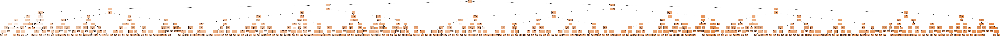

In [24]:
from IPython.display import Image
from IPython.core.display import HTML 
PATH = "decision_tree_2.png"
Image(filename = PATH , width=900, height=600)

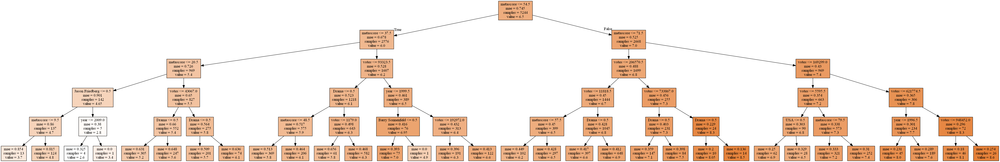

In [25]:
from IPython.display import Image
from IPython.core.display import HTML 
PATH = "decision_tree_3.png"
Image(filename = PATH , width=900, height=600)

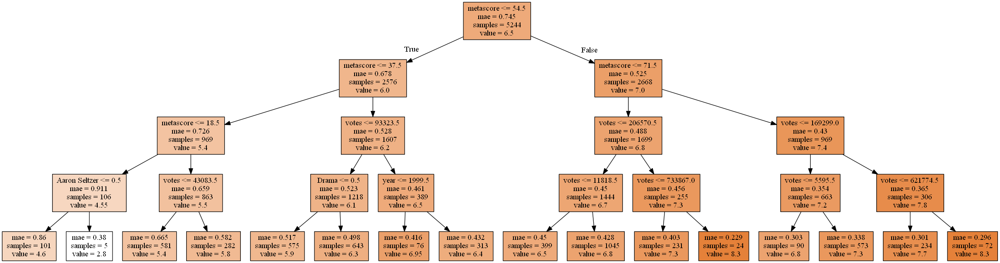

In [26]:
from IPython.display import Image
from IPython.core.display import HTML 
PATH = "decision_tree_4.png"
Image(filename = PATH , width=900, height=600)